# I. Algorithm

## 1.Mathematics:
### Boundary line:
$$\begin{eqnarray}
f_{\mathbf{w}}(\mathbf{x}) &=& w_1x_1 + \dots + w_dx_d + w_0 \\ 
&=&\mathbf{w}^T\mathbf{\bar{x}} = 0
\end{eqnarray}$$
Label of an instance is identified as:
$$\text{label}(\mathbf{x}) = 1 ~\text{if}~ \mathbf{w}^T\mathbf{x} \geq 0, \text{otherwise} -1$$
which simplified as
$$\text{label}(\mathbf{x}) = \text{sgn}(\mathbf{w}^T\mathbf{x})$$
Note: 
- $\text{sgn}(0) = 1$

### Lost function:
$$J_*(\mathbf{w}) = (-y_i\text{sgn}(\mathbf{w}^T\mathbf{x_i}))$$
$J_*$ is discrete and hard to be optimized so it need converting into:
$$J(\mathbf{w}) = (-y_i\mathbf{w}^T\mathbf{x_i})$$
$J$ is also better than $J*$ as it treat wrong values depended on their distances to boundary line.

### Derivative:
$$\nabla_{\mathbf{w}}J(\mathbf{w}; \mathbf{x}_i; y_i) = -y_i\mathbf{x}_i$$
The theta will updated by:
$$\mathbf{w} = \mathbf{w} + \eta y_i\mathbf{x}_i$$

## 2.Code
- Step 1: Create the function to calculate y_hat. ($label(𝐱)=sgn(𝐰𝑇𝐱)$)
- Step 2: Randomly initialize $w$ near 0.
- Step 3: Check all instances. If the label is wrong, update $w$ and then check again until there is no misclassifed points.
- Step 4: Use the boundary line to predict new values.

In [7]:
import numpy as np
class PerceptronLearningAlgorithm(object):
    def __init__(self):
        self.X_train = np.array([])
        self.y_train = np.array([])
        self.X_predict = np.array([])
        self.y_predict = np.array([])
        self.theta = np.array([])

    def fit(self,X_train,y_train):
        self.X_train = X_train
        self.y_train = y_train
    # Step 1: Create the function to calculate y_hat. ( 𝑙𝑎𝑏𝑒𝑙(𝐱)=𝑠𝑔𝑛(𝐰𝑇𝐱) )     
    def hypothesis(self, X, theta):
        return np.sign(X.dot(theta))
    
    def calculate_theta(self):
        X_bar = np.concatenate((np.ones((self.X_train.shape[0], 1)), self.X_train), axis=1)
        N, d = X_bar.shape[0], X_bar.shape[1]
        # Step 2: Randomly initialize  𝑤  near 0.
        self.theta = np.random.randn(d)
        # Step 3: Check all instances. If the label is wrong, update w and then check again until there is no misclassifed points.
        while True:
            h = self.hypothesis(X_bar, self.theta)
            mis_idxs = np.where(np.equal(h, self.y_train) == False)[0]
            if mis_idxs.shape[0] == 0:
                break
            random_id = np.random.choice(mis_idxs, 1)[0]
            self.theta = self.theta + self.y_train[random_id]*X_bar[random_id]
            print(self.theta)
    # Step 4: Use the boundary line to predict new values.   
    def predict(self, X_predict):
        self.calculate_theta()
        self.X_predict = X_predict
        X_predict_bar = np.concatenate((np.ones((self.X_predict.shape[0], 1)), self.X_predict), axis=1)
        self.y_predict = self.hypothesis(X_predict_bar, self.theta)
        return self.y_predict

# II.Practice

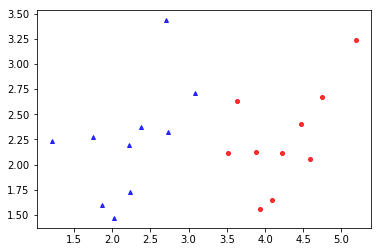

In [8]:
# Create data
np.random.seed(2)
means = [[2, 2], [4, 2]]
cov = [[.3, .2], [.2, .3]]
N = 10
X0 = np.random.multivariate_normal(means[0], cov, N)
X1 = np.random.multivariate_normal(means[1], cov, N)
X_train = np.concatenate((X0, X1), axis = 0)
y_train = np.asarray([0]*N + [1]*N).T
# Plot data
import matplotlib.pyplot as plt
def display(X, label):
    X0 = X[label == 0]
    X1 = X[label == 1]
    plt.plot(X0[:, 0], X0[:, 1], 'b^', markersize = 4, alpha = .8)
    plt.plot(X1[:, 0], X1[:, 1], 'ro', markersize = 4, alpha = .8)
    plt.plot()
    plt.show() 
display(X_train, y_train)

In [ ]:
# Create model
model = PerceptronLearningAlgorithm()
model.fit(X_train, y_train)
y_pre = model.predict(X_train)
display(X_train, y_pre)

[-0.3135082   0.77101174 -1.86809065]
[-0.3135082   0.77101174 -1.86809065]
[-0.3135082   0.77101174 -1.86809065]
[-0.3135082   0.77101174 -1.86809065]
[-0.3135082   0.77101174 -1.86809065]
[-0.3135082   0.77101174 -1.86809065]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733

[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.64973314 0.25317819]
[0.6864918  4.649733